# Whisper Demo

Some quick imports and setting the working directory to coincide with the `git` root.

In [1]:
import subprocess
import os
import requests
import librosa
import torch

from getpass import getpass
from transformers import pipeline
from datasets import load_dataset
from IPython.display import Audio

from pyannote.audio import Pipeline as Pyannote_Pipeline
from pyannote.audio.pipelines.utils.hook import ProgressHook

os.chdir(subprocess
         .check_output(["git", "rev-parse", "--show-toplevel"])
         .decode('utf-8')
         .strip())
os.getcwd()

'/home/kerry/Documents/python/transcribe'

We can get a useful audio sample from the recordings of the U.S. supreme court. This cell will extract a ~2 hour recording of a hearing into the data folder for this repository. Since this is a little long we'll use `ffmpeg` to lop off the first two minutes.

In [3]:
import requests

url = 'https://video.isilive.ca/scc/2023/2023-12-05--40166-40399-floor.mp3'
output_file = 'data/samples/court_sample.mp3'

response = requests.get(url)

if response.status_code == 200:
    with open(output_file, 'wb') as file:
        file.write(response.content)
else:
    print(f"Failed to download file. Status code: {response.status_code}")

In [6]:
%%bash
ffmpeg -i data/samples/court_sample.mp3 -ss 00:00:00 -t 00:05:00 -c copy data/samples/court_sample_short.mp3

ffmpeg version 7.0.2 Copyright (c) 2000-2024 the FFmpeg developers
  built with gcc 13.3.0 (conda-forge gcc 13.3.0-1)
  configuration: --prefix=/home/kerry/Documents/python/transcribe/.mamba/envs/MADRS-transcribe --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1726843814550/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1726843814550/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1726843814550/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1726843814550/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --enable-openssl --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libharfbuzz --enable-libfontconfig --enable-libopenh264 --enable-libdav1d --disable-gnutls --enable-libmp3lame --enable-libvpx --enable-libass --enable-pthreads --enable-vaapi --enable-libopenvino --enable-gpl --enable-libx264 --enable-

Now let's take a listen.

In [14]:
sample_rate = 16000

audio, rate = librosa.load("data/samples/court_sample_short.mp3", sr=sample_rate)
Audio(audio, rate=rate)

Our strategy here is to segment the audio by speaker and label the intervals accordingly. Let's give `pyannote` a shot, after inputting an authorization token.

In [4]:
auth_token = getpass()

 ········


In [ ]:
pyannote_pipeline = Pyannote_Pipeline.from_pretrained(
    "pyannote/speaker-diarization-3.1",
    use_auth_token=auth_token,
)

with ProgressHook() as hook:
    diarization = pyannote_pipeline("data/samples/court_sample_short.mp3", hook=hook)
diarization

We'll want to feed each segment into a transcription model later, and some of these intervals are obnoxiously short and may cause problems.

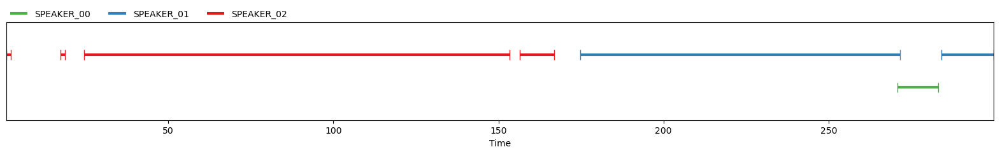

In [24]:
annotated_segments = diarization.support(collar=3)
annotated_segments

That's better. The `collar` argument here joins intervals associated to the same speaker together if they are separated by a less than `collar` seconds.

Now we can take each interval and feed that into `whisper`, where hopefully each segment corresponds to a particular speaker. Below note the half second of padding around each interval; this is to avoid problems where `whisper` doesn't seem to correctly transcribe audio cut off by the end of the recording. Also note the use of the `tiny` model to save on time.

In [32]:
audio_segments = [
    audio[int(max(0,segment.start-0.5)*sample_rate):int(min(len(audio), (segment.end+0.5)*sample_rate))]
    for segment, _ in annotated_segments.itertracks()
]

whisper_pipeline = pipeline(
    "automatic-speech-recognition",
    model="openai/whisper-tiny",
    chunk_length_s=30,
    device="cpu",
    generate_kwargs={"language": "english"},
)

prediction = whisper_pipeline(audio_segments)

Now we can produce a transcript with the labels from the diarization. Compare this with the recording.

In [33]:
itr = annotated_segments.itertracks(yield_label=True)

for i in range(0, len(prediction)):
    _, _, label = next(itr)
    print(label + ":" + prediction[i]['text'] + "\n")

SPEAKER_02: The court, the court.

SPEAKER_02: Good morning, please be seated.

SPEAKER_02: In the case of John Akinoet Al against Ernst and Young, Inc. in its capacity as court appointed monitor of bond field construction company limited and KSV Kaufman Inc. in its capacity as trusted bankruptcy of 10380330 Inc. and 108757 Ontario limited in between loan cuts at Al against Doyle-Sarifski Inc in its capacity as trustee in bankruptcy of Golden Oaks Enterprises Inc. For the Appellan John Ikino at Al Terry Corsianos and George Corsianos and Jack Ebley. For the respondent, KSV Kaufman Inc. in its capacity as trust in bankruptcy of 103803. Ontario Inc. and 108757 Ontario Limited, Jeremy Opolsky and Alex Bogak. For the respondent, Ernst and Young Inc. in its capacity as court appointed monitor of bond field construction company, limited out in Mercky and Stephen Taylor. For the Appellan's Lawrence Cut at Al, shall Al Daou. For the respondents, Doyle-Seleski Inc. in its capacity as trust in b

Keeping things simple for now, we'll wrap this all up in `/src/madrs-transcribe/transcribe.py`, so that e.g. we can transcribe the file above with

```python
import sys
sys.path.append("src/madrs-transcribe/")
import transcribe

transcribe.Pipeline(auth_token)("data/samples/court_sample_short.mp3")
```